In this example we are merging datasets from 22 samples from a study on T cell- mediated colon inflammation associated with immune checkpoint therapies. Both TCRab and TCRgd pairs were sequenced in this study and we will use CoNGA to look for correlations between TCR sequence features and cellular phenotype within both these lineages independently.

Luoma AM, Suo S, Williams HL, Sharova T et al. Molecular Pathways of Colon Inflammation Induced by Cancer Immunotherapy. Cell 2020 Aug 6;182(3):655-671.e22. PMID: 32603654

The data were downloaded from the following URL and moved to the `DATA_DIR` location referenced below.

https://www.ncbi.nlm.nih.gov/geo/download/?acc=GSE144469&format=file

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import os
import sys
import glob
import scanpy as sc
import numpy as np
import pandas as pd
# path to CoNGA repository (downloaded from github); MODIFY FOR YOUR SETUP
CONGA_PATH = '/home/pbradley/gitrepos/conga/'
sys.path.append(CONGA_PATH)
import conga
from conga.tcrdist.make_10x_clones_file import make_10x_clones_file
# location of the GSE144469 files downloaded from the GEO database; MODIFY FOR YOUR SETUP
DATA_DIR = '/home/pbradley/csdat/mimb/newdata/'
#DATA_DIR = '/home/pbradley/csdat/mimb/data/'
os.chdir(DATA_DIR)

# Aggregate the individual GEX runs into a single AnnData object
In the GSE144469 dataset the sample IDs are used as the UMI barcode suffix. 
Here, we will aggregate the individual GEX counts matrices from the 22 samples 
together into a single `AnnData` object.


In [2]:
gex_datasets = sorted(glob.glob('*-CD3/'))
diseases = ['C','NC','CT'] # colitis, no-colitis, healthy control
contigs_file = 'GSE144469_TCR_filtered_contig_annotations_all.csv'
all_contigs = pd.read_csv(contigs_file)
all_data = []
for donor_num, gex_dir in enumerate(gex_datasets):
    # The folder name is also the donor ID
    donor = gex_dir.split('-')[0]
    donor_contigs = all_contigs[all_contigs.barcode.str.endswith(donor)].copy()
    # change the barcode suffix to '-1' to match the GEX data
    donor_contigs['barcode'] = donor_contigs.barcode.str.split('-').str.get(0)+'-1'
    donor_contigs_file = f'{donor}_abtcr_filtered_contigs.csv'
    donor_contigs.to_csv(donor_contigs_file)
    # process the contigs to generate conga clonotypes
    donor_clones_file = f'{donor}_abtcr_clones.tsv'
    make_10x_clones_file(
        donor_contigs_file, 
        organism = 'human', # using 'human' for TCRab
        clones_file = donor_clones_file, 
        stringent = True, # (the default) see Note #1 on clonotype filtering 
    )
    # read the GEX data and the clonotypes into CoNGA
    adata = conga.preprocess.read_dataset(
        gex_dir, '10x_mtx', donor_clones_file,
        allow_missing_kpca_file=True)
    disease = donor[:-1]
    adata.obs['disease'] = disease
    adata.obs['disease_int'] = diseases.index(disease) # conga batch ids are integers
    adata.obs['donor'] = donor
    adata.obs['donor_int'] = donor_num # conga batch ids are integers
    
    all_data.append( adata )

# concatenate the datasets
new_adata = all_data[0].concatenate(all_data[1:])
#save the aggregate AnnData object
new_adata.write('merged_gex_abtcr.h5ad')

repeat?? 71 13 ('TRAV26-2*01', 'TRAJ21*01', 'CGALLYNFNKFYF', 'tgtggagctttactatacaacttcaacaaattttacttt') ('TRAV34*01', 'TRAJ21*01', 'CGALLYNFNKFYF', 'tgtggagctttactatacaacttcaacaaattttacttt')
repeat?? 1 192 ('TRBV7-2*01', 'TRBJ2-1*01', 'CASSLTGEQFF', 'tgtgccagcagcctgaccggtgagcagttcttc') ('TRBV7-3*01', 'TRBJ2-1*01', 'CASSLTGEQFF', 'tgtgccagcagcctgaccggtgagcagttcttc')
repeat?? 11 23 ('TRBV5-4*01', 'TRBJ2-1*01', 'CASSFGREETQYF', 'tgtgccagcagcttcggacgggaagagacccagtacttc') ('TRBV5-4*01', 'TRBJ2-5*01', 'CASSFGREETQYF', 'tgtgccagcagcttcggacgggaagagacccagtacttc')
ab_counts: [((1, 1), 4650), ((2, 1), 591), ((2, 2), 134), ((1, 2), 98)]
old_unpaired_barcodes: 386 old_paired_barcodes: 5504 new_stringent_paired_barcodes: 5241
reading: C1-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3862 (3862, 33538)
reading: C1_abtcr_clones.tsv
Reducing to the 2828 barcodes (out of 3862) with paired TCR sequence data
repeat?? 577 7 ('TRAV12-1*01', 'TRAJ42*01', 'CVVNPGGRGSQGNLIF', 'tgtgtggtgaacccgggcggacgaggaagccaaggaaatctcatcttt') ('TRAV12-2*01', 'TRAJ42*01', 'CVVNPGGRGSQGNLIF', 'tgtgtggtgaacccgggcggacgaggaagccaaggaaatctcatcttt')
repeat?? 3 3 ('TRAV4*01', 'TRAJ31*01', 'CAEWSLGNNARLMF', 'tgtgcagagtggagtctggggaacaatgccagactcatgttt') ('TRAV5*01', 'TRAJ31*01', 'CAEWSLGNNARLMF', 'tgtgcagagtggagtctggggaacaatgccagactcatgttt')
repeat?? 9 64 ('TRBV18*01', 'TRBJ1-1*01', 'CASRQTGRNTEAFF', 'tgtgccagtaggcagacagggcggaacactgaagctttcttt') ('TRBV19*01', 'TRBJ1-1*01', 'CASRQTGRNTEAFF', 'tgtgccagtaggcagacagggcggaacactgaagctttcttt')
repeat?? 86 4 ('TRAV12-1*01', 'TRAJ23*01', 'CVVNAGKGGKLIF', 'tgtgtggtgaacgccggaaagggaggaaagcttatcttc') ('TRAV12-2*01', 'TRAJ23*01', 'CVVNAGKGGKLIF', 'tgtgtggtgaacgccggaaagggaggaaagcttatcttc')
repeat?? 1 61 ('TRAV3*01', 'TRAJ30*01', 'CAESIGKIIF', 'tgtgcag

/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 4209 (4209, 33538)
reading: C2_abtcr_clones.tsv
Reducing to the 3406 barcodes (out of 4209) with paired TCR sequence data
repeat?? 7 19 ('TRAV4*01', 'TRAJ20*01', 'CAGFNDYKLSF', 'tgtgcagggttcaacgactacaagctcagcttt') ('TRAV5*01', 'TRAJ20*01', 'CAGFNDYKLSF', 'tgtgcagggttcaacgactacaagctcagcttt')
ab_counts: [((1, 1), 4699), ((2, 1), 514), ((2, 2), 109), ((1, 2), 67)]
old_unpaired_barcodes: 510 old_paired_barcodes: 5408 new_stringent_paired_barcodes: 5213
reading: C3-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 4511 (4511, 33538)
reading: C3_abtcr_clones.tsv
Reducing to the 3210 barcodes (out of 4511) with paired TCR sequence data
repeat?? 47 3 ('TRBV19*01', 'TRBJ1-5*01', 'CASSWGGERGNQPQHF', 'tgtgccagtagttgggggggggagaggggcaatcagccccagcatttt') ('TRBV19*01', 'TRBJ2-4*01', 'CASSWGGERGNQPQHF', 'tgtgccagtagttgggggggggagaggggcaatcagccccagcatttt')
repeat?? 2 40 ('TRAV20*01', 'TRAJ44*01', 'CAVQESNFGNEKLTF', 'tgtgctgtgcaggaatctaactttggaaatgagaaattaaccttt') ('TRAV20*01', 'TRAJ48*01', 'CAVQESNFGNEKLTF', 'tgtgctgtgcaggaatctaactttggaaatgagaaattaaccttt')
repeat?? 8 57 ('TRBV18*01', 'TRBJ1-3*01', 'CASSRRYGNTIYF', 'tgtgccagtagtcggaggtatggaaacaccatatatttt') ('TRBV19*01', 'TRBJ1-3*01', 'CASSRRYGNTIYF', 'tgtgccagtagtcggaggtatggaaacaccatatatttt')
repeat?? 6 17 ('TRBV18*01', 'TRBJ2-6*01', 'CASSAPTGTVSSGANVLTF', 'tgtgccagtagtgccccgaccgggacagtaagctctggggccaacgtcctgactttc') ('TRBV19*01', 'TRBJ2-6*01', 'CASSAPTGTVSSGANVLTF', 'tgtgccagtagtgccccgaccgggacagtaagctctggggccaacgtcctgactttc')
ab_counts: [((1,

/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3694 (3694, 33538)
reading: C4_abtcr_clones.tsv
Reducing to the 2873 barcodes (out of 3694) with paired TCR sequence data
repeat?? 11 160 ('TRBV18*01', 'TRBJ2-7*01', 'CASSIPGQGVHEQYF', 'tgtgccagtagtatacccgggcagggggtccacgagcagtacttc') ('TRBV19*01', 'TRBJ2-7*01', 'CASSIPGQGVHEQYF', 'tgtgccagtagtatacccgggcagggggtccacgagcagtacttc')
repeat?? 6 50 ('TRAV4*01', 'TRAJ47*01', 'CAESGEYGNKLVF', 'tgtgcagagagtggggaatatggaaacaaactggtcttt') ('TRAV5*01', 'TRAJ47*01', 'CAESGEYGNKLVF', 'tgtgcagagagtggggaatatggaaacaaactggtcttt')
ab_counts: [((1, 1), 5414), ((2, 1), 903), ((2, 2), 225), ((1, 2), 103)]
old_unpaired_barcodes: 302 old_paired_barcodes: 6662 new_stringent_paired_barcodes: 6317
reading: C5-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 4140 (4140, 33538)
reading: C5_abtcr_clones.tsv
Reducing to the 3456 barcodes (out of 4140) with paired TCR sequence data
repeat?? 2 202 ('TRAV8-4*01', 'TRAJ16*01', 'CAVTRGDGQKLLF', 'tgtgctgtgacccggggggatggccagaagctgctcttt') ('TRAV8-6*01', 'TRAJ16*01', 'CAVTRGDGQKLLF', 'tgtgctgtgacccggggggatggccagaagctgctcttt')
repeat?? 2 184 ('TRBV6-2*01', 'TRBJ2-5*01', 'CASSYNGRVETQYF', 'tgtgccagcagttacaacggcagggtagagacccagtacttc') ('TRBV6-5*01', 'TRBJ2-5*01', 'CASSYNGRVETQYF', 'tgtgccagcagttacaacggcagggtagagacccagtacttc')
repeat?? 3 5 ('TRBV18*01', 'TRBJ2-7*01', 'CASSPQGGMREQYF', 'tgtgccagtagtcctcagggtgggatgcgcgagcagtacttc') ('TRBV19*01', 'TRBJ2-7*01', 'CASSPQGGMREQYF', 'tgtgccagtagtcctcagggtgggatgcgcgagcagtacttc')
repeat?? 1 16 ('TRAV18*01', 'TRAJ20*01', 'CALRGNDYKLSF', 'tgtgctctgagagggaacgactacaagctcagcttt') ('TRAV19*01', 'TRAJ20*01', 'CALRGNDYKLSF', 'tgtgctctgagagggaacgactacaagctcagcttt')
repeat?? 78 3 ('TRBV11-2*01', 'TRBJ2-3*01', 'CASSLVGLAGAFTDTQYF', 'tgtgccagcagcttagtaggtctagc

/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3293 (3293, 33538)
reading: C6_abtcr_clones.tsv
Reducing to the 2542 barcodes (out of 3293) with paired TCR sequence data
repeat?? 9 3 ('TRBV28*01', 'TRBJ2-2*01', 'CASRPYWEGELFF', 'tgtgccagcaggccctactgggaaggggagctgtttttt') ('TRBV6-9*01', 'TRBJ2-2*01', 'CASRPYWEGELFF', 'tgtgccagcaggccctactgggaaggggagctgtttttt')
ab_counts: [((1, 1), 2612), ((2, 1), 332), ((2, 2), 184), ((1, 2), 66), ((1, 3), 2)]
old_unpaired_barcodes: 170 old_paired_barcodes: 3197 new_stringent_paired_barcodes: 2944
reading: C7-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3717 (3717, 33538)
reading: C7_abtcr_clones.tsv
Reducing to the 2797 barcodes (out of 3717) with paired TCR sequence data
repeat?? 8 10 ('TRBV18*01', 'TRBJ2-5*01', 'CASSMIMTGGRAGDRTQYF', 'tgtgccagtagtatgatcatgacgggcgggagggccggagataggacccagtacttc') ('TRBV19*01', 'TRBJ2-5*01', 'CASSMIMTGGRAGDRTQYF', 'tgtgccagtagtatgatcatgacgggcgggagggccggagataggacccagtacttc')
ab_counts: [((1, 1), 2826), ((2, 1), 395), ((2, 2), 137), ((1, 2), 93)]
old_unpaired_barcodes: 136 old_paired_barcodes: 3451 new_stringent_paired_barcodes: 3221
reading: C8-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3778 (3778, 33538)
reading: C8_abtcr_clones.tsv
Reducing to the 3066 barcodes (out of 3778) with paired TCR sequence data
repeat?? 7 77 ('TRBV18*01', 'TRBJ2-7*01', 'CASSIWGFSYEQYF', 'tgtgccagtagtatatgggggttttcctacgagcagtacttc') ('TRBV19*01', 'TRBJ2-7*01', 'CASSIWGFSYEQYF', 'tgtgccagtagtatatgggggttttcctacgagcagtacttc')
ab_counts: [((1, 1), 2359), ((2, 1), 291), ((2, 2), 72), ((1, 2), 59)]
old_unpaired_barcodes: 208 old_paired_barcodes: 2784 new_stringent_paired_barcodes: 2650
reading: CT1-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3937 (3937, 33538)
reading: CT1_abtcr_clones.tsv
Reducing to the 2632 barcodes (out of 3937) with paired TCR sequence data
ab_counts: [((1, 1), 1928), ((2, 1), 163), ((2, 2), 82), ((1, 2), 43)]
old_unpaired_barcodes: 131 old_paired_barcodes: 2223 new_stringent_paired_barcodes: 2091
reading: CT2-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 2962 (2962, 33538)
reading: CT2_abtcr_clones.tsv
Reducing to the 2076 barcodes (out of 2962) with paired TCR sequence data
ab_counts: [((1, 1), 2788), ((2, 1), 321), ((2, 2), 122), ((1, 2), 60)]
old_unpaired_barcodes: 195 old_paired_barcodes: 3294 new_stringent_paired_barcodes: 3109
reading: CT3-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3896 (3896, 33538)
reading: CT3_abtcr_clones.tsv
Reducing to the 3094 barcodes (out of 3896) with paired TCR sequence data
repeat?? 2 3 ('TRAV1-1*01', 'TRAJ38*01', 'CGLSNNRKLIW', 'tgtgggttaagcaacaaccgtaagctgatttgg') ('TRAV1-2*01', 'TRAJ38*01', 'CGLSNNRKLIW', 'tgtgggttaagcaacaaccgtaagctgatttgg')
ab_counts: [((1, 1), 1905), ((2, 1), 243), ((2, 2), 102), ((1, 2), 36), ((3, 1), 2)]
old_unpaired_barcodes: 127 old_paired_barcodes: 2291 new_stringent_paired_barcodes: 2148
reading: CT4-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 2740 (2740, 33538)
reading: CT4_abtcr_clones.tsv
Reducing to the 2125 barcodes (out of 2740) with paired TCR sequence data
repeat?? 1 4 ('TRAV26-2*01', 'TRAJ10*01', 'CAGPLLTGGGNKLTF', 'tgtgctgggcccctactcacgggaggaggaaacaaactcaccttt') ('TRAV35*01', 'TRAJ10*01', 'CAGPLLTGGGNKLTF', 'tgtgctgggcccctactcacgggaggaggaaacaaactcaccttt')
ab_counts: [((1, 1), 1677), ((2, 1), 206), ((2, 2), 65), ((1, 2), 27)]
old_unpaired_barcodes: 126 old_paired_barcodes: 1975 new_stringent_paired_barcodes: 1883
reading: CT5-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3079 (3079, 33538)
reading: CT5_abtcr_clones.tsv
Reducing to the 1824 barcodes (out of 3079) with paired TCR sequence data
repeat?? 5 10 ('TRAV4*01', 'TRAJ40*01', 'CAESGSGTYKYIF', 'tgtgcagagagcgggtcaggaacctacaaatacatcttt') ('TRAV5*01', 'TRAJ40*01', 'CAESGSGTYKYIF', 'tgtgcagagagcgggtcaggaacctacaaatacatcttt')
ab_counts: [((1, 1), 3588), ((2, 1), 328), ((2, 2), 78), ((1, 2), 67)]
old_unpaired_barcodes: 267 old_paired_barcodes: 4064 new_stringent_paired_barcodes: 3916
reading: CT6-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 4848 (4848, 33538)
reading: CT6_abtcr_clones.tsv
Reducing to the 3907 barcodes (out of 4848) with paired TCR sequence data
ab_counts: [((1, 1), 2500), ((2, 1), 304), ((2, 2), 61), ((1, 2), 49)]
old_unpaired_barcodes: 232 old_paired_barcodes: 2917 new_stringent_paired_barcodes: 2804
reading: CT7-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3612 (3612, 33538)
reading: CT7_abtcr_clones.tsv
Reducing to the 2790 barcodes (out of 3612) with paired TCR sequence data
repeat?? 5 3 ('TRAV26-2*01', 'TRAJ40*01', 'CGAATSGTYKYIF', 'tgtggagcagctacctcaggaacctacaaatacatcttt') ('TRAV34*01', 'TRAJ40*01', 'CGAATSGTYKYIF', 'tgtggagcagctacctcaggaacctacaaatacatcttt')
repeat?? 23 6 ('TRBV7-2*01', 'TRBJ1-6*01', 'CASSLVTANNSPLHF', 'tgtgccagcagcttagtcacagcaaataattcacccctccacttt') ('TRBV7-9*01', 'TRBJ1-6*01', 'CASSLVTANNSPLHF', 'tgtgccagcagcttagtcacagcaaataattcacccctccacttt')
ab_counts: [((1, 1), 2308), ((2, 1), 249), ((2, 2), 72), ((1, 2), 62)]
old_unpaired_barcodes: 209 old_paired_barcodes: 2700 new_stringent_paired_barcodes: 2557
reading: CT8-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3432 (3432, 33538)
reading: CT8_abtcr_clones.tsv
Reducing to the 2533 barcodes (out of 3432) with paired TCR sequence data
ab_counts: [((1, 1), 2165), ((2, 1), 232), ((2, 2), 75), ((1, 2), 51)]
old_unpaired_barcodes: 216 old_paired_barcodes: 2523 new_stringent_paired_barcodes: 2397
reading: NC1-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3135 (3135, 33538)
reading: NC1_abtcr_clones.tsv
Reducing to the 2378 barcodes (out of 3135) with paired TCR sequence data
repeat?? 577 7 ('TRAV12-1*01', 'TRAJ42*01', 'CVVNPGGRGSQGNLIF', 'tgtgtggtgaacccgggcggacgaggaagccaaggaaatctcatcttt') ('TRAV12-2*01', 'TRAJ42*01', 'CVVNPGGRGSQGNLIF', 'tgtgtggtgaacccgggcggacgaggaagccaaggaaatctcatcttt')
repeat?? 1 61 ('TRAV3*01', 'TRAJ30*01', 'CAESIGKIIF', 'tgtgcagagagtattggcaagatcatcttt') ('TRAV5*01', 'TRAJ30*01', 'CAESIGKIIF', 'tgtgcagagagtattggcaagatcatcttt')
repeat?? 2 39 ('TRBV18*01', 'TRBJ2-7*01', 'CASSISGGAQIPYEQYF', 'tgtgccagtagtatttccggcggggcgcaaataccctacgagcagtacttc') ('TRBV19*01', 'TRBJ2-7*01', 'CASSISGGAQIPYEQYF', 'tgtgccagtagtatttccggcggggcgcaaataccctacgagcagtacttc')
ab_counts: [((1, 1), 2321), ((2, 1), 384), ((2, 2), 75), ((1, 2), 39)]
old_unpaired_barcodes: 161 old_paired_barcodes: 2819 new_stringent_paired_barcodes: 2705
reading: NC2-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 4049 (4049, 33538)
reading: NC2_abtcr_clones.tsv
Reducing to the 2681 barcodes (out of 4049) with paired TCR sequence data
ab_counts: [((1, 1), 1763), ((2, 1), 175), ((2, 2), 30), ((1, 2), 19)]
old_unpaired_barcodes: 130 old_paired_barcodes: 1989 new_stringent_paired_barcodes: 1938
reading: NC3-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3078 (3078, 33538)
reading: NC3_abtcr_clones.tsv
Reducing to the 1930 barcodes (out of 3078) with paired TCR sequence data
repeat?? 2 40 ('TRAV20*01', 'TRAJ44*01', 'CAVQESNFGNEKLTF', 'tgtgctgtgcaggaatctaactttggaaatgagaaattaaccttt') ('TRAV20*01', 'TRAJ48*01', 'CAVQESNFGNEKLTF', 'tgtgctgtgcaggaatctaactttggaaatgagaaattaaccttt')
repeat?? 6 17 ('TRBV18*01', 'TRBJ2-6*01', 'CASSAPTGTVSSGANVLTF', 'tgtgccagtagtgccccgaccgggacagtaagctctggggccaacgtcctgactttc') ('TRBV19*01', 'TRBJ2-6*01', 'CASSAPTGTVSSGANVLTF', 'tgtgccagtagtgccccgaccgggacagtaagctctggggccaacgtcctgactttc')
ab_counts: [((1, 1), 2749), ((2, 1), 255), ((1, 2), 50), ((2, 2), 48), ((3, 1), 9)]
old_unpaired_barcodes: 215 old_paired_barcodes: 3114 new_stringent_paired_barcodes: 3004
reading: NC4-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3784 (3784, 33538)
reading: NC4_abtcr_clones.tsv
Reducing to the 2941 barcodes (out of 3784) with paired TCR sequence data
ab_counts: [((1, 1), 2240), ((2, 1), 442), ((2, 2), 121), ((1, 2), 44)]
old_unpaired_barcodes: 138 old_paired_barcodes: 2854 new_stringent_paired_barcodes: 2682
reading: NC5-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3534 (3534, 33538)
reading: NC5_abtcr_clones.tsv
Reducing to the 2599 barcodes (out of 3534) with paired TCR sequence data
repeat?? 3 5 ('TRBV18*01', 'TRBJ2-7*01', 'CASSPQGGMREQYF', 'tgtgccagtagtcctcagggtgggatgcgcgagcagtacttc') ('TRBV19*01', 'TRBJ2-7*01', 'CASSPQGGMREQYF', 'tgtgccagtagtcctcagggtgggatgcgcgagcagtacttc')
repeat?? 78 3 ('TRBV11-2*01', 'TRBJ2-3*01', 'CASSLVGLAGAFTDTQYF', 'tgtgccagcagcttagtaggtctagcgggggccttcacagatacgcagtatttt') ('TRBV4-2*01', 'TRBJ2-3*01', 'CASSLVGLAGAFTDTQYF', 'tgtgccagcagcttagtaggtctagcgggggccttcacagatacgcagtatttt')
ab_counts: [((1, 1), 2687), ((2, 1), 344), ((2, 2), 106), ((1, 2), 68)]
old_unpaired_barcodes: 302 old_paired_barcodes: 3207 new_stringent_paired_barcodes: 3031
reading: NC6-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 4200 (4200, 33538)
reading: NC6_abtcr_clones.tsv
Reducing to the 2967 barcodes (out of 4200) with paired TCR sequence data


... storing 'va' as categorical
... storing 'ja' as categorical
... storing 'cdr3a' as categorical
... storing 'cdr3a_nucseq' as categorical
... storing 'vb' as categorical
... storing 'jb' as categorical
... storing 'cdr3b' as categorical
... storing 'cdr3b_nucseq' as categorical
... storing 'disease' as categorical
... storing 'donor' as categorical
... storing 'feature_types' as categorical


In [4]:
new_adata

AnnData object with n_obs × n_vars = 60655 × 33538
    obs: 'va', 'ja', 'cdr3a', 'cdr3a_nucseq', 'vb', 'jb', 'cdr3b', 'cdr3b_nucseq', 'disease', 'disease_int', 'donor', 'donor_int', 'batch'
    var: 'gene_ids', 'feature_types'

# Now do the same thing for the gamma-delta T cell data

In [5]:
all_data = []

for donor_num, gex_dir in enumerate(gex_datasets):
    # The folder name is also the donor ID
    donor = gex_dir.split('-')[0]
    donor_contigs_file = glob.glob(f'*_{donor}-gdTCR_filtered_contig_annotations.csv')
    if len(donor_contigs_file)==0:
        continue
    else:
        assert len(donor_contigs_file) == 1
        donor_contigs_file = donor_contigs_file[0]
    # process the contigs to generate conga clonotypes
    donor_clones_file = f'{donor}_gdtcr_clones.tsv'
    make_10x_clones_file(
        donor_contigs_file, 
        organism = 'human_gd', # using 'human_gd' for gdTCR
        clones_file = donor_clones_file, 
        stringent = True, # (the default) See Note #1 on clonotype filtering
    )
    # read the GEX data and the clonotypes into CoNGA
    adata = conga.preprocess.read_dataset(
        gex_dir, '10x_mtx', donor_clones_file,
        allow_missing_kpca_file=True)
    disease = donor[:-1]
    adata.obs['disease'] = disease
    adata.obs['disease_int'] = diseases.index(disease) # conga batch ids are integers
    adata.obs['donor'] = donor
    adata.obs['donor_int'] = donor_num # conga batch ids are integers
    all_data.append( adata )

# concatenate the datasets
new_adata = all_data[0].concatenate(all_data[1:])

#save the aggregate AnnData object
new_adata.write('merged_gex_gdtcr.h5ad')

repeat?? 7 4 ('TRGV5*01', 'TRGJ2*01', 'CATWDYKKLF', 'tgtgccacctgggattataagaaactcttt') ('TRGV8*01', 'TRGJ2*01', 'CATWDYKKLF', 'tgtgccacctgggattataagaaactcttt')
repeat?? 5 17 ('TRGV2*01', 'TRGJ2*01', 'CATWDRRRYKKLF', 'tgtgccacctgggataggcgacggtataagaaactcttt') ('TRGV8*01', 'TRGJ2*01', 'CATWDRRRYKKLF', 'tgtgccacctgggataggcgacggtataagaaactcttt')
repeat?? 7 5 ('TRGV2*01', 'TRGJ2*01', 'CATWDGNYYKKLF', 'tgtgccacctgggacgggaattattataagaaactcttt') ('TRGV3*01', 'TRGJ2*01', 'CATWDGNYYKKLF', 'tgtgccacctgggacgggaattattataagaaactcttt')
ab_counts: [((1, 1), 162), ((2, 1), 21)]
old_unpaired_barcodes: 416 old_paired_barcodes: 183 new_stringent_paired_barcodes: 183
reading: C1-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3862 (3862, 33538)
reading: C1_gdtcr_clones.tsv
Reducing to the 183 barcodes (out of 3862) with paired TCR sequence data
repeat?? 7 464 ('TRGV2*01', 'TRGJ2*01', 'CATWDGGGDYYKKLF', 'tgtgccacctgggacggtgggggggattattataagaaactcttt') ('TRGV4*01', 'TRGJ2*01', 'CATWDGGGDYYKKLF', 'tgtgccacctgggacggtgggggggattattataagaaactcttt')
repeat?? 16 78 ('TRGV2*01', 'TRGJ2*01', 'CATWDGRYKKLF', 'tgtgccacctgggacgggcggtataagaaactcttt') ('TRGV4*01', 'TRGJ2*01', 'CATWDGRYKKLF', 'tgtgccacctgggacgggcggtataagaaactcttt')
ab_counts: [((1, 1), 195), ((2, 1), 90), ((1, 2), 1), ((3, 1), 1)]
old_unpaired_barcodes: 465 old_paired_barcodes: 290 new_stringent_paired_barcodes: 285
reading: C3-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 4511 (4511, 33538)
reading: C3_gdtcr_clones.tsv
Reducing to the 285 barcodes (out of 4511) with paired TCR sequence data
repeat?? 2430 3 ('TRGV2*01', 'TRGJP2*01', 'CATWDGRWIKTF', 'tgtgccacctgggacgggcgctggatcaagacgttt') ('TRGV8*01', 'TRGJP2*01', 'CATWDGRWIKTF', 'tgtgccacctgggacgggcgctggatcaagacgttt')
ab_counts: [((1, 1), 120), ((2, 1), 5), ((1, 2), 4)]
old_unpaired_barcodes: 404 old_paired_barcodes: 130 new_stringent_paired_barcodes: 125
reading: C4-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3694 (3694, 33538)
reading: C4_gdtcr_clones.tsv
Reducing to the 124 barcodes (out of 3694) with paired TCR sequence data
ab_counts: [((1, 1), 68), ((2, 1), 5), ((1, 2), 1)]
old_unpaired_barcodes: 495 old_paired_barcodes: 74 new_stringent_paired_barcodes: 73
reading: C5-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 4140 (4140, 33538)
reading: C5_gdtcr_clones.tsv
Reducing to the 70 barcodes (out of 4140) with paired TCR sequence data
repeat?? 5 8 ('TRGV2*01', 'TRGJ2*01', 'CATWDANYYKKLF', 'tgtgccacctgggacgcgaattattataagaaactcttt') ('TRGV4*01', 'TRGJ2*01', 'CATWDANYYKKLF', 'tgtgccacctgggacgcgaattattataagaaactcttt')
ab_counts: [((1, 1), 105), ((2, 1), 7), ((1, 2), 1)]
old_unpaired_barcodes: 237 old_paired_barcodes: 114 new_stringent_paired_barcodes: 112
reading: C6-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3293 (3293, 33538)
reading: C6_gdtcr_clones.tsv
Reducing to the 111 barcodes (out of 3293) with paired TCR sequence data
repeat?? 3 102 ('TRGV2*01', 'TRGJ2*01', 'CATWECYYKKLF', 'tgtgccacctgggaatgttattataagaaactcttt') ('TRGV8*01', 'TRGJ2*01', 'CATWECYYKKLF', 'tgtgccacctgggaatgttattataagaaactcttt')
repeat?? 3 6 ('TRGV2*01', 'TRGJ2*01', 'CATWDGLYYKKLF', 'tgtgccacctgggacgggctttattataagaaactcttt') ('TRGV5*01', 'TRGJ2*01', 'CATWDGLYYKKLF', 'tgtgccacctgggacgggctttattataagaaactcttt')
ab_counts: [((1, 1), 146), ((2, 1), 2)]
old_unpaired_barcodes: 305 old_paired_barcodes: 153 new_stringent_paired_barcodes: 148
reading: C7-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3717 (3717, 33538)
reading: C7_gdtcr_clones.tsv
Reducing to the 148 barcodes (out of 3717) with paired TCR sequence data
ab_counts: [((1, 1), 23), ((2, 1), 1)]
old_unpaired_barcodes: 308 old_paired_barcodes: 24 new_stringent_paired_barcodes: 24
reading: C8-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3778 (3778, 33538)
reading: C8_gdtcr_clones.tsv
Reducing to the 24 barcodes (out of 3778) with paired TCR sequence data
ab_counts: [((1, 1), 418), ((2, 1), 186), ((2, 2), 4), ((1, 2), 2)]
old_unpaired_barcodes: 238 old_paired_barcodes: 619 new_stringent_paired_barcodes: 604
reading: CT1-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3937 (3937, 33538)
reading: CT1_gdtcr_clones.tsv
Reducing to the 604 barcodes (out of 3937) with paired TCR sequence data
ab_counts: [((1, 1), 219), ((2, 1), 9), ((1, 2), 3), ((2, 2), 1)]
old_unpaired_barcodes: 185 old_paired_barcodes: 234 new_stringent_paired_barcodes: 228
reading: CT2-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 2962 (2962, 33538)
reading: CT2_gdtcr_clones.tsv
Reducing to the 228 barcodes (out of 2962) with paired TCR sequence data
ab_counts: [((1, 1), 157), ((2, 1), 14), ((1, 2), 1)]
old_unpaired_barcodes: 394 old_paired_barcodes: 173 new_stringent_paired_barcodes: 171
reading: CT3-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3896 (3896, 33538)
reading: CT3_gdtcr_clones.tsv
Reducing to the 171 barcodes (out of 3896) with paired TCR sequence data
ab_counts: [((1, 1), 55), ((1, 2), 2), ((2, 2), 1)]
old_unpaired_barcodes: 317 old_paired_barcodes: 58 new_stringent_paired_barcodes: 55
reading: CT4-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 2740 (2740, 33538)
reading: CT4_gdtcr_clones.tsv
Reducing to the 55 barcodes (out of 2740) with paired TCR sequence data
repeat?? 3 6 ('TRGV2*01', 'TRGJ2*01', 'CATWPRGYYKKLF', 'tgtgccacctggcctcggggttattataagaaactcttt') ('TRGV8*01', 'TRGJ2*01', 'CATWPRGYYKKLF', 'tgtgccacctggcctcggggttattataagaaactcttt')
ab_counts: [((1, 1), 490), ((2, 1), 32), ((2, 2), 7), ((1, 2), 3), ((3, 1), 1)]
old_unpaired_barcodes: 363 old_paired_barcodes: 541 new_stringent_paired_barcodes: 522
reading: CT5-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3079 (3079, 33538)
reading: CT5_gdtcr_clones.tsv
Reducing to the 514 barcodes (out of 3079) with paired TCR sequence data
repeat?? 4 1766 ('TRGV4*01', 'TRGJP2*01', 'CATWDRQIGIKTF', 'tgtgccacctgggataggcaaattgggatcaagacgttt') ('TRGV8*01', 'TRGJP2*01', 'CATWDRQIGIKTF', 'tgtgccacctgggataggcaaattgggatcaagacgttt')
ab_counts: [((1, 1), 77), ((2, 1), 4)]
old_unpaired_barcodes: 930 old_paired_barcodes: 82 new_stringent_paired_barcodes: 81
reading: CT6-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 4848 (4848, 33538)
reading: CT6_gdtcr_clones.tsv
Reducing to the 81 barcodes (out of 4848) with paired TCR sequence data
repeat?? 1 205 ('TRGV3*01', 'TRGJ2*01', 'CATWEREKKLF', 'tgtgccacctgggaacgagaaaagaaactcttt') ('TRGV5*01', 'TRGJ2*01', 'CATWEREKKLF', 'tgtgccacctgggaacgagaaaagaaactcttt')
ab_counts: [((1, 1), 153), ((2, 1), 29), ((1, 2), 1), ((1, 3), 1)]
old_unpaired_barcodes: 351 old_paired_barcodes: 187 new_stringent_paired_barcodes: 182
reading: CT7-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3612 (3612, 33538)
reading: CT7_gdtcr_clones.tsv
Reducing to the 182 barcodes (out of 3612) with paired TCR sequence data
repeat?? 376 15 ('TRGV2*01', 'TRGJ2*01', 'CATWDGREDYYKKLF', 'tgtgccacctgggacgggcgcgaggattattataagaaactcttt') ('TRGV8*01', 'TRGJ2*01', 'CATWDGREDYYKKLF', 'tgtgccacctgggacgggcgcgaggattattataagaaactcttt')
ab_counts: [((1, 1), 236), ((2, 1), 19), ((1, 2), 1)]
old_unpaired_barcodes: 376 old_paired_barcodes: 258 new_stringent_paired_barcodes: 255
reading: CT8-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3432 (3432, 33538)
reading: CT8_gdtcr_clones.tsv
Reducing to the 255 barcodes (out of 3432) with paired TCR sequence data
repeat?? 472 28 ('TRGV4*01', 'TRGJ2*01', 'CATWDGPHYYKKLF', 'tgtgccacctgggacgggccccattattataagaaactcttt') ('TRGV8*01', 'TRGJ2*01', 'CATWDGPHYYKKLF', 'tgtgccacctgggacgggccccattattataagaaactcttt')
repeat?? 1 57 ('TRGV2*01', 'TRGJ2*01', 'CATWDGPTAVQKLF', 'tgtgccacctgggacgggcccacggccgttcagaaactcttt') ('TRGV4*01', 'TRGJ2*01', 'CATWDGPTAVQKLF', 'tgtgccacctgggacgggcccacggccgttcagaaactcttt')
repeat?? 6 8 ('TRGV4*01', 'TRGJ2*01', 'CATWDGPHYYKKLF', 'tgtgccacctgggacgggccccattattataagaaactcttt') ('TRGV8*01', 'TRGJ2*01', 'CATWDGPHYYKKLF', 'tgtgccacctgggacgggccccattattataagaaactcttt')
ab_counts: [((1, 1), 85), ((2, 1), 75), ((1, 2), 6), ((2, 2), 1)]
old_unpaired_barcodes: 173 old_paired_barcodes: 167 new_stringent_paired_barcodes: 160
reading: NC1-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3135 (3135, 33538)
reading: NC1_gdtcr_clones.tsv
Reducing to the 160 barcodes (out of 3135) with paired TCR sequence data
repeat?? 14 291 ('TRGV3*01', 'TRGJP1*01', 'CATWDEDPHTTGWFKIF', 'tgtgccacctgggacgaggacccgcataccactggttggttcaagatattt') ('TRGV5*01', 'TRGJP1*01', 'CATWDEDPHTTGWFKIF', 'tgtgccacctgggacgaggacccgcataccactggttggttcaagatattt')
ab_counts: [((1, 1), 494), ((2, 1), 107), ((1, 2), 1), ((2, 2), 1)]
old_unpaired_barcodes: 436 old_paired_barcodes: 610 new_stringent_paired_barcodes: 601
reading: NC2-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 4049 (4049, 33538)
reading: NC2_gdtcr_clones.tsv
Reducing to the 599 barcodes (out of 4049) with paired TCR sequence data
repeat?? 9 210 ('TRGV2*01', 'TRGJ2*01', 'CATWDRHPRHYSKKLF', 'tgtgccacctgggacaggcacccccgccattattccaagaaactcttt') ('TRGV3*01', 'TRGJ2*01', 'CATWDRHPRHYSKKLF', 'tgtgccacctgggacaggcacccccgccattattccaagaaactcttt')
ab_counts: [((1, 1), 232), ((2, 1), 195)]
old_unpaired_barcodes: 154 old_paired_barcodes: 435 new_stringent_paired_barcodes: 427
reading: NC3-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3078 (3078, 33538)
reading: NC3_gdtcr_clones.tsv
Reducing to the 427 barcodes (out of 3078) with paired TCR sequence data
ab_counts: [((1, 1), 109), ((2, 1), 21)]
old_unpaired_barcodes: 212 old_paired_barcodes: 131 new_stringent_paired_barcodes: 130
reading: NC4-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3784 (3784, 33538)
reading: NC4_gdtcr_clones.tsv
Reducing to the 130 barcodes (out of 3784) with paired TCR sequence data
repeat?? 7 4 ('TRGV4*01', 'TRGJ2*01', 'CATWDKKLF', 'tgtgccacctgggataagaaactcttt') ('TRGV8*01', 'TRGJ2*01', 'CATWDKKLF', 'tgtgccacctgggataagaaactcttt')
ab_counts: [((1, 1), 198), ((2, 1), 12), ((1, 2), 2)]
old_unpaired_barcodes: 292 old_paired_barcodes: 212 new_stringent_paired_barcodes: 210
reading: NC5-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 3534 (3534, 33538)
reading: NC5_gdtcr_clones.tsv
Reducing to the 208 barcodes (out of 3534) with paired TCR sequence data
repeat?? 2 293 ('TRGV4*01', 'TRGJP1*01', 'CATWDTTGWFKIF', 'tgtgccacctgggataccactggttggttcaagatattt') ('TRGV8*01', 'TRGJP1*01', 'CATWDTTGWFKIF', 'tgtgccacctgggataccactggttggttcaagatattt')
ab_counts: [((1, 1), 384), ((1, 2), 15), ((2, 1), 14)]
old_unpaired_barcodes: 447 old_paired_barcodes: 424 new_stringent_paired_barcodes: 398
reading: NC6-CD3/ of type 10x_mtx


/home/pbradley/gitrepos/conga/conga/preprocess.py:233: DeprecationWarning: Use is_view instead of isview, isview will be removed in the future.
  if adata.isview: # ran into trouble with AnnData views vs copies


total barcodes: 4200 (4200, 33538)
reading: NC6_gdtcr_clones.tsv
Reducing to the 398 barcodes (out of 4200) with paired TCR sequence data


... storing 'va' as categorical
... storing 'ja' as categorical
... storing 'cdr3a' as categorical
... storing 'cdr3a_nucseq' as categorical
... storing 'vb' as categorical
... storing 'jb' as categorical
... storing 'cdr3b' as categorical
... storing 'cdr3b_nucseq' as categorical
... storing 'disease' as categorical
... storing 'donor' as categorical
... storing 'feature_types' as categorical


In [6]:
new_adata

AnnData object with n_obs × n_vars = 4957 × 33538
    obs: 'va', 'ja', 'cdr3a', 'cdr3a_nucseq', 'vb', 'jb', 'cdr3b', 'cdr3b_nucseq', 'disease', 'disease_int', 'donor', 'donor_int', 'batch'
    var: 'gene_ids', 'feature_types'

# now run the CoNGA analysis pipeline on the merged AB TCRs

In [7]:
# this string will be prepended to all CoNGA output files
out_prefix = 'conga_abtcr'

# Read the merged AnnData object containing transcript counts and TCR information
# this was generated using the (dataset-specific) pipeline provided in Appendix 1
adata = sc.read_h5ad('merged_gex_abtcr.h5ad')

# Store the organism for this analysis in the uns array
# Set organism to 'human' for human alpha-beta TCR analysis
# other options are 'human_gd' 'human_ig' 'mouse' 'mouse_gd'
adata.uns['organism'] = 'human'

# tell CoNGA to annotate results with these batch definitions (present in adata.obs)
# disease_int: 0= +CPI colitis, 1= +CPI no colitis, 2= healthy control 
adata.uns['batch_keys'] = ['disease_int','donor_int']

print('adata.shape:', adata.shape)
print('adata.obs_keys():', adata.obs_keys())

adata.shape: (60655, 33538)
adata.obs_keys(): ['va', 'ja', 'cdr3a', 'cdr3a_nucseq', 'vb', 'jb', 'cdr3b', 'cdr3b_nucseq', 'disease', 'disease_int', 'donor', 'donor_int', 'batch']


In [8]:
# Perform QC filtering and scale GEX
adata = conga.preprocess.filter_and_scale(
    adata,
    min_genes_per_cell = 500, 
    max_genes_per_cell = 3000,
    max_percent_mito = 0.1
)

# reduce to CD8 cells (see Note 4)
adata_cd4, adata_cd8 = conga.devel.split_into_cd4_and_cd8_subsets(
    adata, verbose= True)
adata = adata_cd8


# Reduce dataset down to a single representative cell per clonotype.
# OPTION: The average_clone_gex option allows you represent GEX of the
#  clonotype as the average across all cells in the clonotype.
adata = conga.preprocess.reduce_to_single_cell_per_clone( adata )

# Perform dimensionality reduction and clustering of GEX and TCR data. 
# UMAP reduction and louvain clustering are the defaults.
adata = conga.preprocess.cluster_and_tsne_and_umap(adata)

print('adata.shape:', adata.shape)
print('adata.obs_keys():', adata.obs_keys())
print('adata.obsm_keys():', adata.obsm_keys())


filtered out 4650 cells with more than 3000 genes
filtered out 1914 cells with more than 0.1 percent mito
get_feature_types_varname: feature_types feature_type_counts: [('Gene Expression', 20419)]
num antibody features: 0
excluding 171 TR genes (89 variable)
excluding 12 sexlinked genes
total of 682 variable genes (54064, 20419)
Normalize and logging matrix...
get_feature_types_varname: feature_types feature_type_counts: [('Gene Expression', 682)]
feature_types counter: [('Gene Expression', 20419)]
normalize_and_log_the_raw_matrix: adata.raw.X.max()=  20895.0
split_by_CD4_CD8: cluster  0 4308 cd8 cd4:     0.005 cd8:     1.235
split_by_CD4_CD8: cluster  1 4201 cd8 cd4:     0.071 cd8:     1.077
split_by_CD4_CD8: cluster  2 3713 cd4 cd4:     1.234 cd8:     0.041
split_by_CD4_CD8: cluster  3 3603 cd4 cd4:     1.121 cd8:     0.055
split_by_CD4_CD8: cluster  4 3201 cd4 cd4:     1.237 cd8:     0.048
split_by_CD4_CD8: cluster  5 2791 cd4 cd4:     1.187 cd8:     0.039
split_by_CD4_CD8: cluster 

/home/pbradley/gitrepos/conga/conga/preprocess.py:1872: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['distances'] = distances
/home/pbradley/gitrepos/conga/conga/preprocess.py:1873: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'] = connectivities


DONE running umap
running 1D UMAP
ran louvain clustering: 1.0 clusters_tcr
DONE running louvain clusters_tcr
adata.shape: (8585, 682)
adata.obs_keys(): ['va', 'ja', 'cdr3a', 'cdr3a_nucseq', 'vb', 'jb', 'cdr3b', 'cdr3b_nucseq', 'disease', 'disease_int', 'donor', 'donor_int', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden_gex_for_cd4_vs_cd8', 'cd4_or_cd8', 'clone_sizes', 'gex_variation', 'louvain_gex', 'clusters_gex', 'clusters_tcr']
adata.obsm_keys(): ['X_pca_gex', 'disease_int', 'donor_int', 'X_umap_gex', 'X_gex_1d', 'X_gex_2d', 'X_tcr_2d', 'X_tcr_1d']


# Compute the GEX and TCR neighbor sets

#### NOTE
Here we are defining the neighbor fractions that will be used in subsequent analyses. 
We routinely use both 1% and 10% of the clonotypes' connected neighbors. 
Since the similarity graphs are directed, those clonotypes in the smaller fraction may not necessairily be in the larger fraction or vice versa.

The neighbors are stored as GEX,TCR tuples in the `all_nbrs` dictionary indexed by `nbr_frac` (neighbor fraction: nbr_frac = 0.1 means K-nearest neighbor graph with `K = 0.1*num_clonotypes`)

So, to unpack the GEX and TCR neighbor sets for a given value of `nbr_frac`, do: 
```
nbrs_gex, nbrs_tcr = all_nbrs[nbr_frac]
```

In [9]:
# specify the neighbor fractions
nbr_fracs = [0.01, 0.1]

# construct the K nearest neighbor graphs for each neighbor fraction
all_nbrs, nndists_gex, nndists_tcr = conga.preprocess.calc_nbrs(
    adata, nbr_fracs, also_calc_nndists=True, 
    nbr_frac_for_nndists= nbr_fracs[0],
) 

# store the NNdists in adata.obs
adata.obs['nndists_gex'] = nndists_gex
adata.obs['nndists_tcr'] = nndists_tcr

# stores the annotated TCR cluster names in adata.uns
conga.preprocess.setup_tcr_cluster_names(adata)

calc_nbrs: obsm_tag_tcr not present in adata.obsm calculating exact tcrdist nbrs
compute D gex 8585
argpartitions: 0.01 8585 gex
calculate nndists: gex 0.01
DONE calculating nndists: gex 0.01
argpartitions: 0.1 8585 gex
skipping tcr nbr calc: None
calculate_tcrdist_nbrs_cpp: (8585, 682) [0.01, 0.1] tmp_nbrs4049
util.run_command: cmd= /home/pbradley/gitrepos/conga/tcrdist_cpp/bin/find_neighbors -f tmp_nbrs4049_tcrs.tsv -n 858 -d /home/pbradley/gitrepos/conga/tcrdist_cpp/db/tcrdist_info_human.txt -o tmp_nbrs4049_calc_tcrdist -a tmp_nbrs4049_agroups.txt -b tmp_nbrs4049_bgroups.txt
reading array of size 8585x858 from tmp_nbrs4049_calc_tcrdist_knn_indices.txt
reading array of size 8585x858 from tmp_nbrs4049_calc_tcrdist_knn_distances.txt
all_nbrs tcrdist using 2918900 bytes nbr_frac= 0.01
all_nbrs tcrdist using 29463720 bytes nbr_frac= 0.1
setup_tcr_cluster_names: ['0', '1_AV8', '2_AV12', '3_av38', '4_AV1', '5', '6_BV20', '7_AV19', '8_av26', '9_av17', '10', '11_AV21', '12_av22', '13_AV9', '

# Run CoNGA TCR similarity-based literature matching

Here we match the TCRs in the dataset to a database of paired TCR sequences of 
known epitope specificity (or to a user-provided database using the `db_tcrs_tsvfile`
argument). The default database is `conga/data/new_paired_tcr_db_for_matching_nr.tsv` (see the readme file `conga/data/new_paired_tcr_db_for_matching_nr_README.txt` for information about where these TCR sequences come from. 
Major contributors are the VDJdb database, the McPAS database, the 10x 200k dataset, the Dash et al TCRdist dataset.

In [10]:
# match TCRs in the dataset to a database derived from literature sources
match_results = conga.tcr_clumping.match_adata_tcrs_to_db_tcrs(
    adata, outfile_prefix= out_prefix,
    num_random_samples_for_bg_freqs=500000, #default is 50000
)

# There is also the ability to simply look for single chains matching in amino acid sequence
alpha_hits, beta_hits = conga.tcr_clumping.strict_single_chain_match_adata_tcrs_to_db_tcrs(
    adata, outfile_prefix = out_prefix,
)

# show the top paired results, focusing on a few columns of interest
cols = 'tcrdist pvalue_adj va cdr3a vb cdr3b db_epitope db_epitope_gene db_mhc_trim'.split()
match_results.drop_duplicates('clone_index')[cols].head(15)

tcr_clumping.match_adata_tcrs_to_db_tcrs: Matching to default literature TCR database; for more info see conga/data/new_paired_tcr_db_for_matching_nr_README.txt
Matching to paired tcrs in /home/pbradley/gitrepos/conga/conga/data/new_paired_tcr_db_for_matching_nr.tsv
num_comparisons: 35404540 8585 4124
parse_tcr_junctions: 0 8585
parse_tcr_junctions: 1000 8585
parse_tcr_junctions: 2000 8585
parse_tcr_junctions: 3000 8585
parse_tcr_junctions: 4000 8585
parse_tcr_junctions: 5000 8585
parse_tcr_junctions: 6000 8585
parse_tcr_junctions: 7000 8585
parse_tcr_junctions: 8000 8585
success_rate: 83.96
success_rate: 93.08
util.run_command: cmd= /home/pbradley/gitrepos/conga/tcrdist_cpp/bin/calc_distributions -f tmp_nbrs5268_tcrs.tsv -m 200 -d /home/pbradley/gitrepos/conga/tcrdist_cpp/db/tcrdist_info_human.txt -a tmp_nbrs5268_bg_achains.tsv -b tmp_nbrs5268_bg_bchains.tsv -o tmp_nbrs5268_dists.txt
find_significant_tcrdist_matches:: max_dist: 200 max_dist_for_matching: 141
util.run_command: cmd= /ho

,tcrdist,pvalue_adj,va,cdr3a,vb,cdr3b,db_epitope,db_epitope_gene,db_mhc_trim
72,0,0.000035,TRAV5*01,CAEYSSASKIIF,TRBV14*01,CASSQSPGGTQYF,GLCTLVAML,BMLF1,A*02
47,0,0.000035,TRAV17*01,CATVLRMDSSYKLIF,TRBV7-9*01,CASSLIGVSSYNEQFF,TPRVTGGGAM,pp65,B*07
69,0,0.000035,TRAV5*01,CAEYSSASKIIF,TRBV14*01,CASSQSPGGTQYF,GLCTLVAML,BMLF1,A*02
99,9,0.000035,TRAV5*01,CASDDNARLMF,TRBV20-1*01,CSARDQTGNGYTF,GLCTLVAML,BMLF1,A*02
63,0,0.000708,TRAV5*01,CAESIGKLIF,TRBV29-1*01,CSVGTGGTNEKLFF,GLCTLVAML,,A*02
76,6,0.000708,TRAV5*01,CAESIGKIIF,TRBV29-1*01,CSVGTGGTNEKLFF,GLCTLVAML,,A*02
54,0,0.000850,TRAV26-2*01,CILPLAGGTSYGKLTF,TRBV7-8*01,CASSLGQAYEQYF,FLRGRAYGL,EBNA3A,B*08
58,0,0.000850,TRAV26-2*01,CILPLAGGTSYGKLTF,TRBV7-8*01,CASSLGQAYEQYF,FLRGRAYGL,EBNA3A,B*08
2,21,0.002691,TRAV1-2*01,CAATSSGGSYIPTF,TRBV10-3*01,CAGGTGDSNQPQHF,EPLPQGQLTAY,BZLF1,B*35
172,0,0.002832,TRAV8-6*01,CAVGGSQGNLIF,TRBV19*01,CASSIRSSYEQYF,GILGFVFTL,M,A*02


# Run CoNGA graph-vs-graph analysis

find_neighbor_neighbor_interactions:
find_neighbor_cluster_interactions:
find_neighbor_cluster_interactions:
find_neighbor_neighbor_interactions:
find_neighbor_cluster_interactions:
find_neighbor_cluster_interactions:
saved graph_vs_graph results to tsvfile: conga_abtcr_graph_vs_graph.tsv
making tcr score table, #features= 35


... storing 'cd4_or_cd8' as categorical
... storing 'test' as categorical


run rank_genes_groups [('none', 7799), ('clp_10_4', 231), ('clp_2_7', 117), ('clp_6_8', 54), ('clp_10_6', 45), ('clp_6_2', 45), ('clp_5_5', 41), ('clp_6_5', 35), ('clp_5_4', 32), ('clp_2_3', 29), ('clp_4_0', 28), ('clp_0_0', 27), ('clp_5_3', 22), ('clp_4_8', 17), ('clp_8_12', 16), ('clp_2_4', 15), ('clp_5_7', 15), ('clp_0_2', 9), ('clp_5_2', 8)]
making cluster logos: 0 18 conga_abtcr_graph_vs_graph_logos.png
making cluster logos: 1 18 conga_abtcr_graph_vs_graph_logos.png
making cluster logos: 2 18 conga_abtcr_graph_vs_graph_logos.png
making cluster logos: 3 18 conga_abtcr_graph_vs_graph_logos.png
making cluster logos: 4 18 conga_abtcr_graph_vs_graph_logos.png
making cluster logos: 5 18 conga_abtcr_graph_vs_graph_logos.png
making cluster logos: 6 18 conga_abtcr_graph_vs_graph_logos.png
making cluster logos: 7 18 conga_abtcr_graph_vs_graph_logos.png
making cluster logos: 8 18 conga_abtcr_graph_vs_graph_logos.png
making cluster logos: 9 18 conga_abtcr_graph_vs_graph_logos.png
making clust

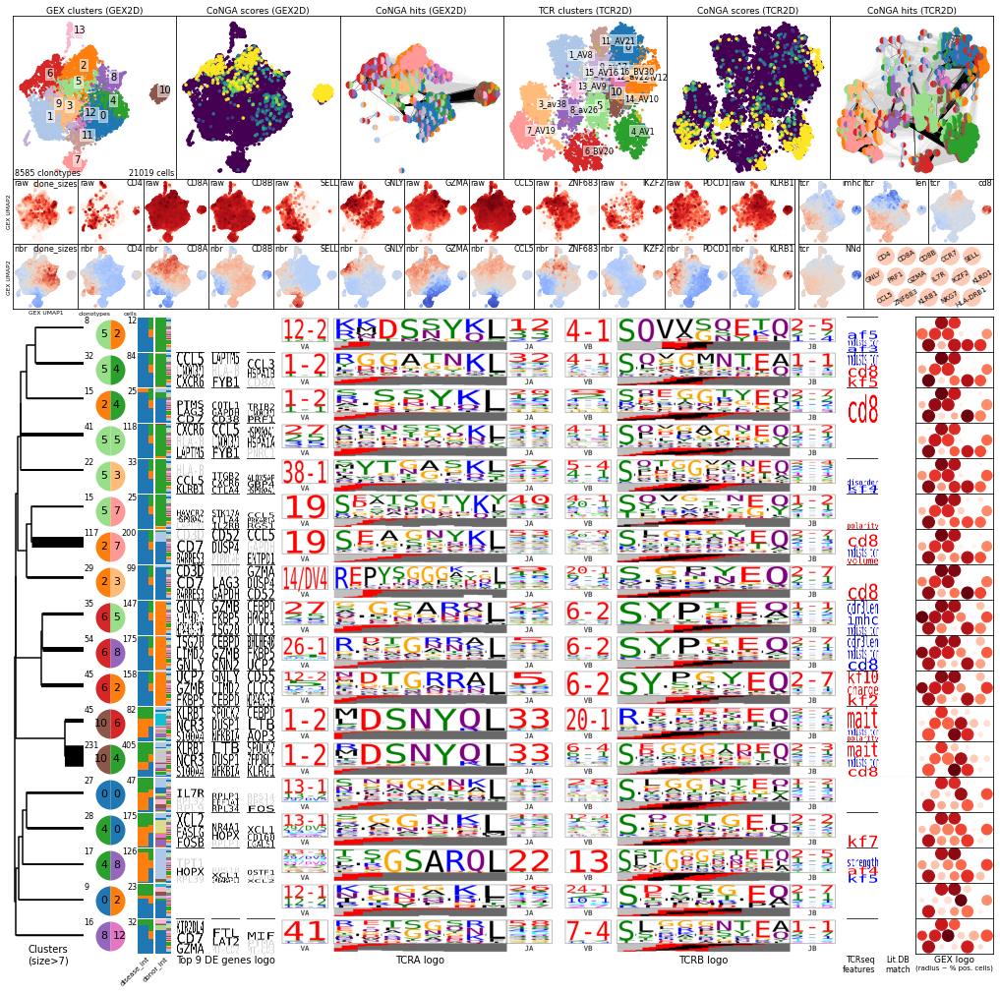

In [11]:
# Run the graph-vs-graph analysis and store results in adata.uns['conga_results']
conga.correlations.run_graph_vs_graph(adata, all_nbrs, outfile_prefix = out_prefix)

# Specify the nbr fraction used for averaging GEX and TCR features for plotting
nbrs_gex, nbrs_tcr = all_nbrs[0.1]

# Specify the minimal conga cluster size for plotting.
# We typically use 0.001 * number of clonotypes in the dataset to limit the FDR.
min_cluster_size = 8

# Generate graph-vs-graph results plot
# If batch keys have been specified and database matching results are stored in the object,
#  they will appear in the plot by default.
conga.plotting.make_graph_vs_graph_logos(
    adata, out_prefix, min_cluster_size,
    nbrs_gex,
    nbrs_tcr,
)

# Run CoNGA graph-vs-feature analysis

making tcr score table, #features= 186
making tcr score table, #features= 186
making tcr score table, #features= 186
saved tcr_graph_vs_gex_features results to tsvfile: conga_abtcr_tcr_graph_vs_gex_features.tsv
saved tcr_genes_vs_gex_features results to tsvfile: conga_abtcr_tcr_genes_vs_gex_features.tsv
saved gex_graph_vs_tcr_features results to tsvfile: conga_abtcr_gex_graph_vs_tcr_features.tsv
fastcluster is not available. Consider installing for faster performance.
computing pairwise X_pca_gex distances, (8585, 40)
computing linkage matrix from pairwise X_pca_gex distances
making clustermap; num_features= 50


/home/pbradley/anaconda2/envs/scanpy_2021a/lib/python3.6/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


making: conga_abtcr_graph_vs_features_gex_clustermap.png
writing help message to file: conga_abtcr_graph_vs_features_gex_clustermap.png_README.txt
fastcluster is not available. Consider installing for faster performance.
making clustermap; num_features= 50
making: conga_abtcr_graph_vs_features_tcr_clustermap.png
writing help message to file: conga_abtcr_graph_vs_features_tcr_clustermap.png_README.txt
making: conga_abtcr_tcr_graph_vs_gex_features_plot.png
writing help message to file: conga_abtcr_tcr_graph_vs_gex_features_plot.png_README.txt
making: conga_abtcr_tcr_graph_vs_gex_features_panels.png
writing help message to file: conga_abtcr_tcr_graph_vs_gex_features_panels.png_README.txt
making: conga_abtcr_tcr_genes_vs_gex_features_panels.png
writing help message to file: conga_abtcr_tcr_genes_vs_gex_features_panels.png_README.txt
making: conga_abtcr_gex_graph_vs_tcr_features_plot.png
writing help message to file: conga_abtcr_gex_graph_vs_tcr_features_plot.png_README.txt
making: conga_ab

/home/pbradley/anaconda2/envs/scanpy_2021a/lib/python3.6/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


making: conga_abtcr_hotspot_gex_features_0.100_nbrs_tcr_plot_clustermap_nbr_avg.png
making: conga_abtcr_hotspot_tcr_features_0.100_nbrs_gex_plot_umap_nbr_avg.png
making: conga_abtcr_hotspot_tcr_features_0.100_nbrs_gex_plot_umap_nbr_avg.png
fastcluster is not available. Consider installing for faster performance.
computing pairwise X_pca_gex distances, (8585, 40)
computing linkage matrix from pairwise X_pca_gex distances
making clustermap; num_features= 25


/home/pbradley/anaconda2/envs/scanpy_2021a/lib/python3.6/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


making: conga_abtcr_hotspot_tcr_features_0.100_nbrs_gex_plot_clustermap_nbr_avg.png
making: conga_abtcr_hotspot_combo_features_0.100_nbrs_gex_plot_umap_nbr_avg.png
making: conga_abtcr_hotspot_combo_features_0.100_nbrs_gex_plot_umap_nbr_avg.png
writing help message to file: conga_abtcr_hotspot_combo_features_0.100_nbrs_gex_plot_umap_nbr_avg.png_README.txt
fastcluster is not available. Consider installing for faster performance.
computing pairwise X_pca_gex distances, (8585, 40)
computing linkage matrix from pairwise X_pca_gex distances
making clustermap; num_features= 50


/home/pbradley/anaconda2/envs/scanpy_2021a/lib/python3.6/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


making: conga_abtcr_hotspot_combo_features_0.100_nbrs_gex_plot_clustermap_nbr_avg.png
writing help message to file: conga_abtcr_hotspot_combo_features_0.100_nbrs_gex_plot_clustermap_nbr_avg.png_README.txt
making: conga_abtcr_hotspot_combo_features_0.100_nbrs_tcr_plot_umap_nbr_avg.png
making: conga_abtcr_hotspot_combo_features_0.100_nbrs_tcr_plot_umap_nbr_avg.png
writing help message to file: conga_abtcr_hotspot_combo_features_0.100_nbrs_tcr_plot_umap_nbr_avg.png_README.txt
fastcluster is not available. Consider installing for faster performance.
making clustermap; num_features= 50


/home/pbradley/anaconda2/envs/scanpy_2021a/lib/python3.6/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


making: conga_abtcr_hotspot_combo_features_0.100_nbrs_tcr_plot_clustermap_nbr_avg.png
writing help message to file: conga_abtcr_hotspot_combo_features_0.100_nbrs_tcr_plot_clustermap_nbr_avg.png_README.txt


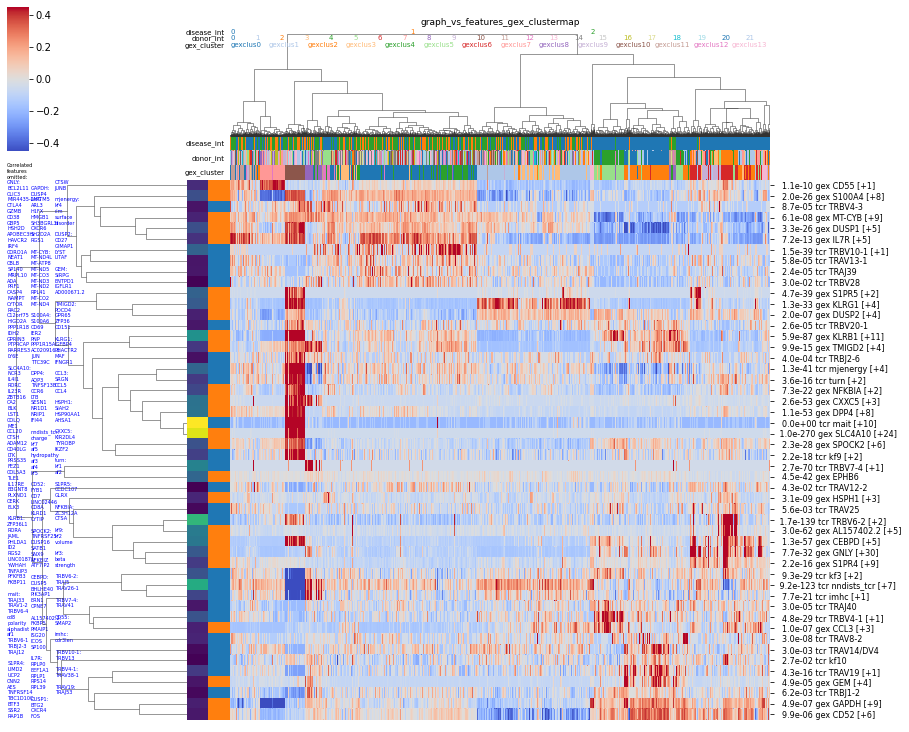

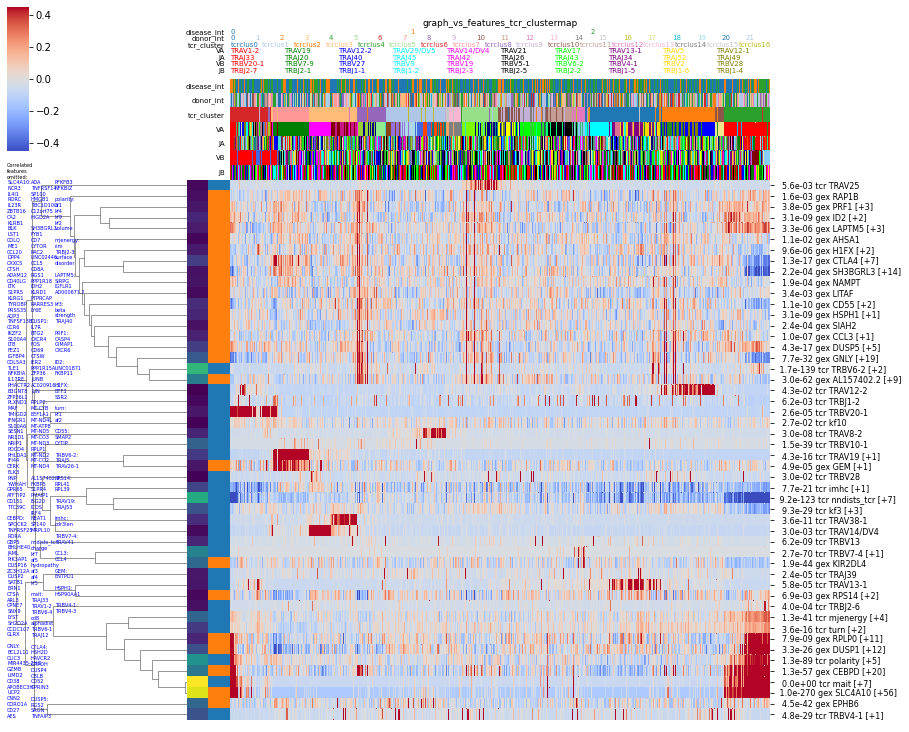

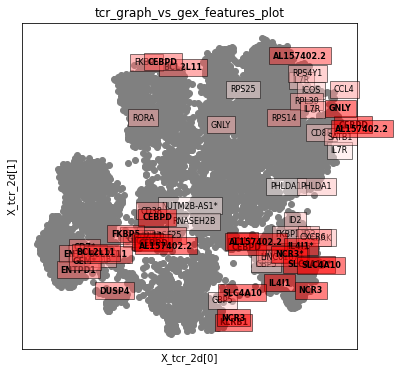

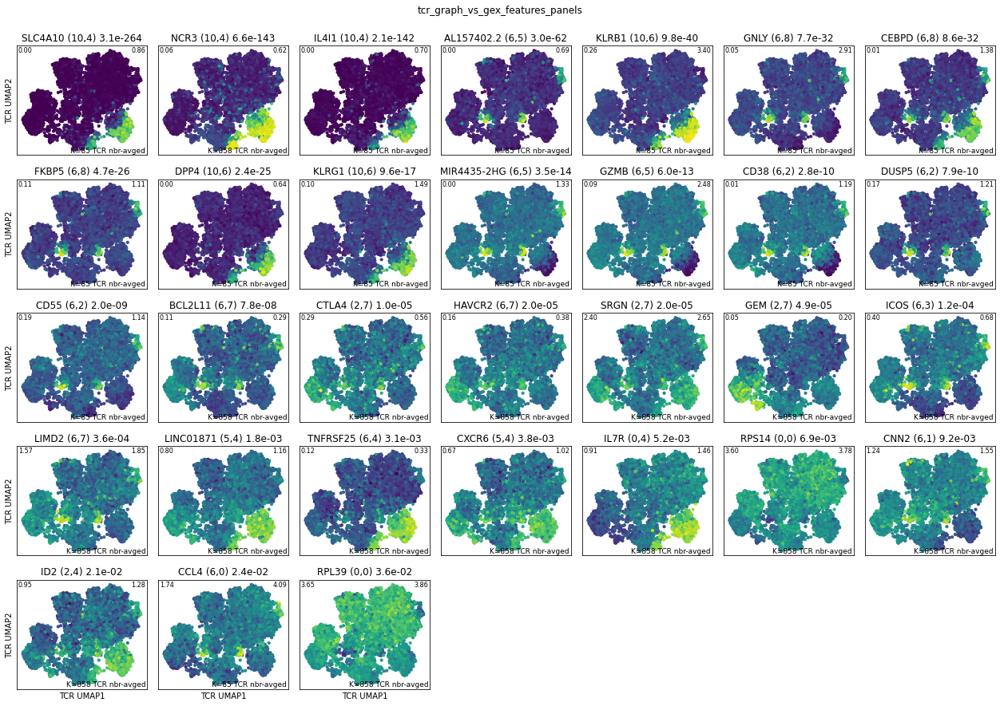

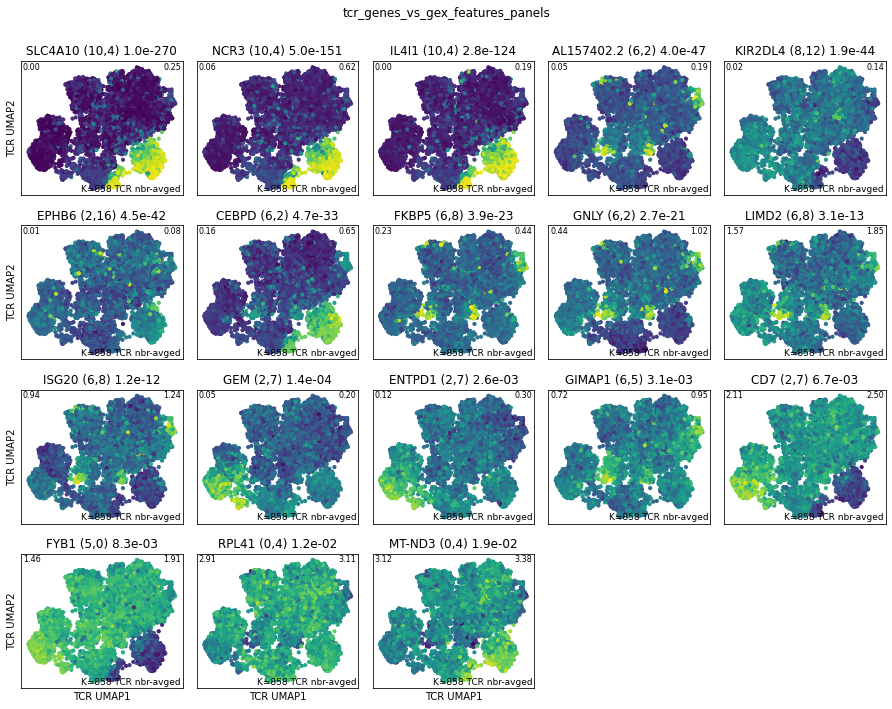

...

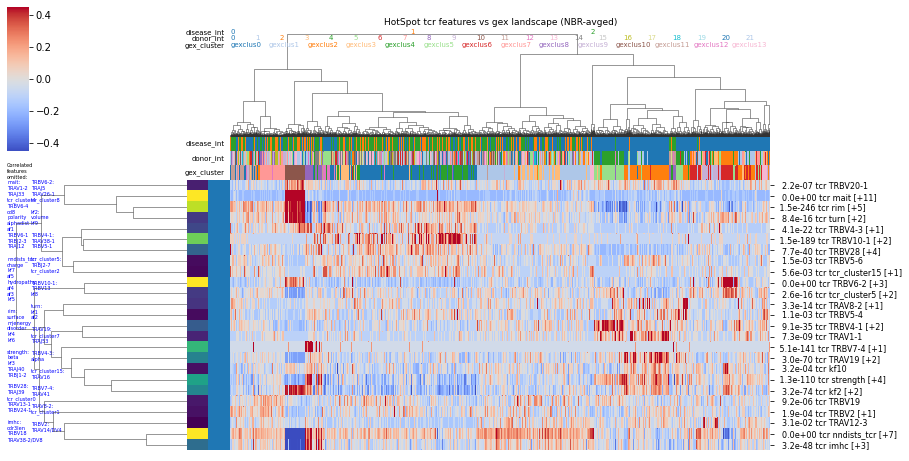

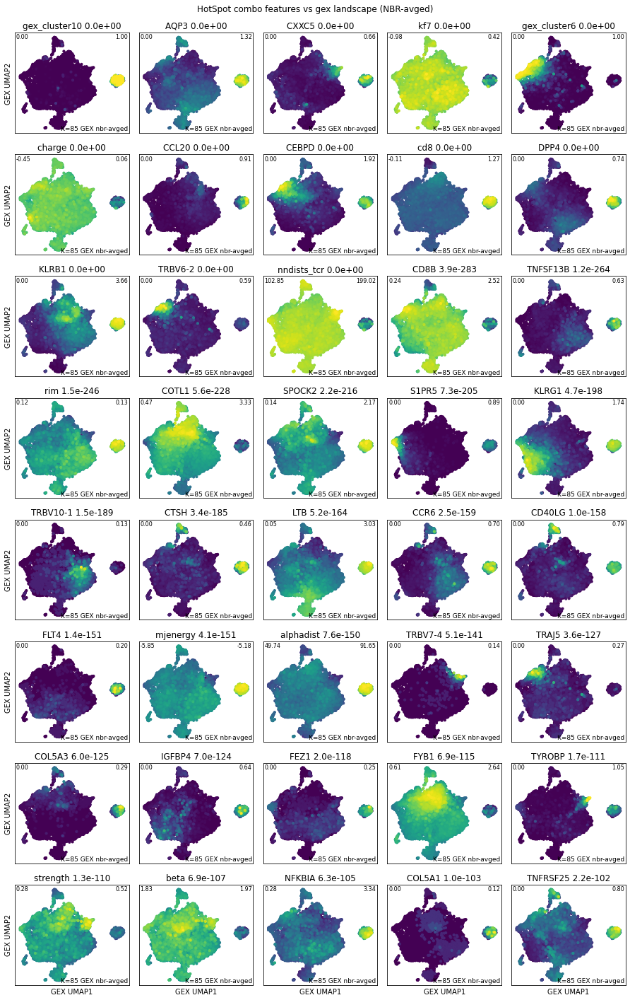

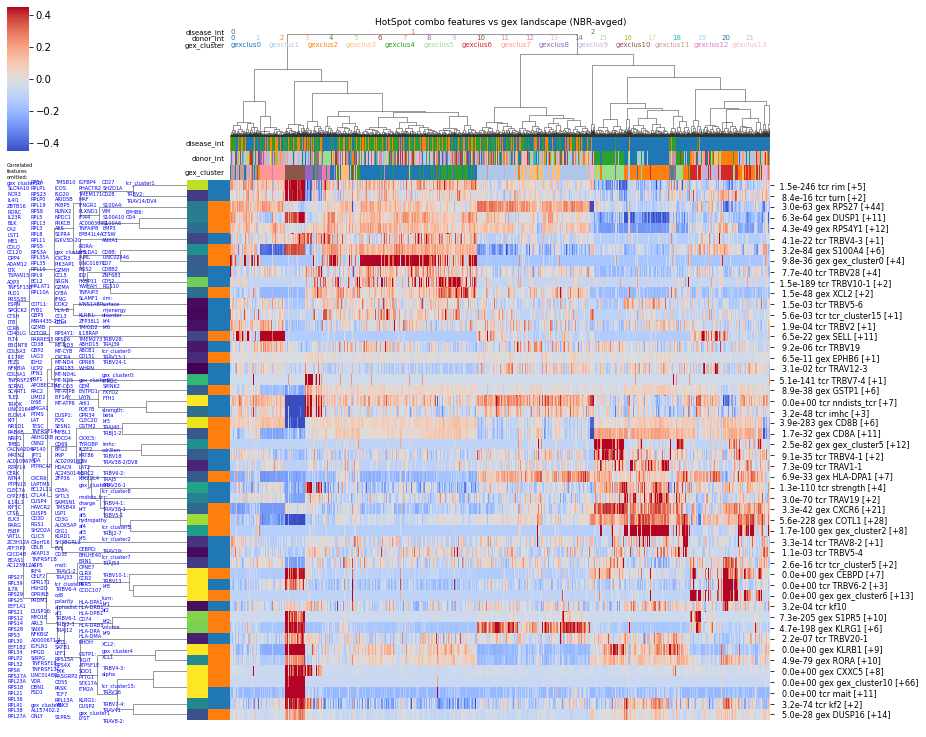

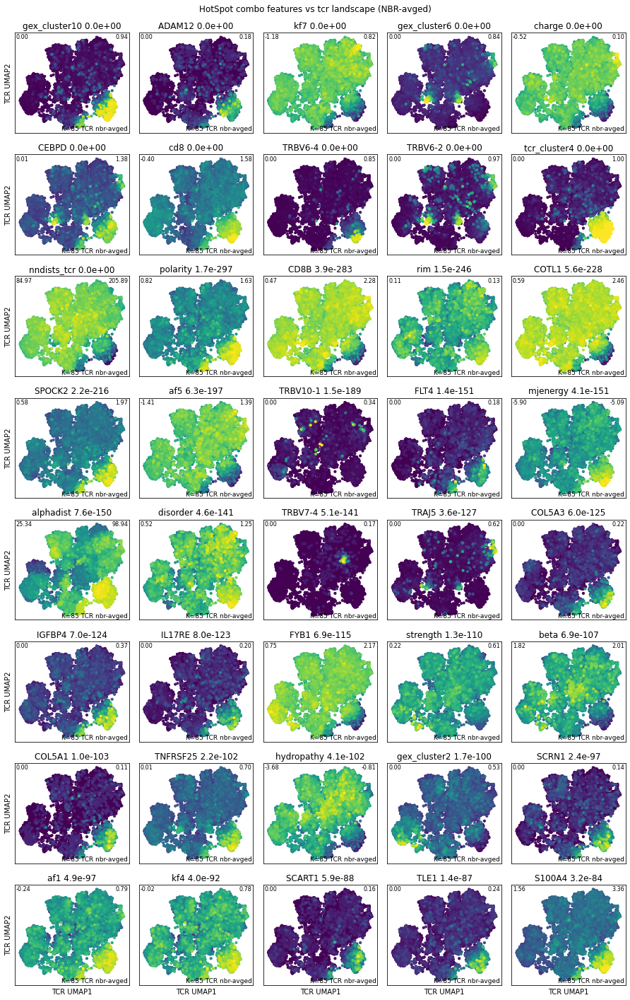

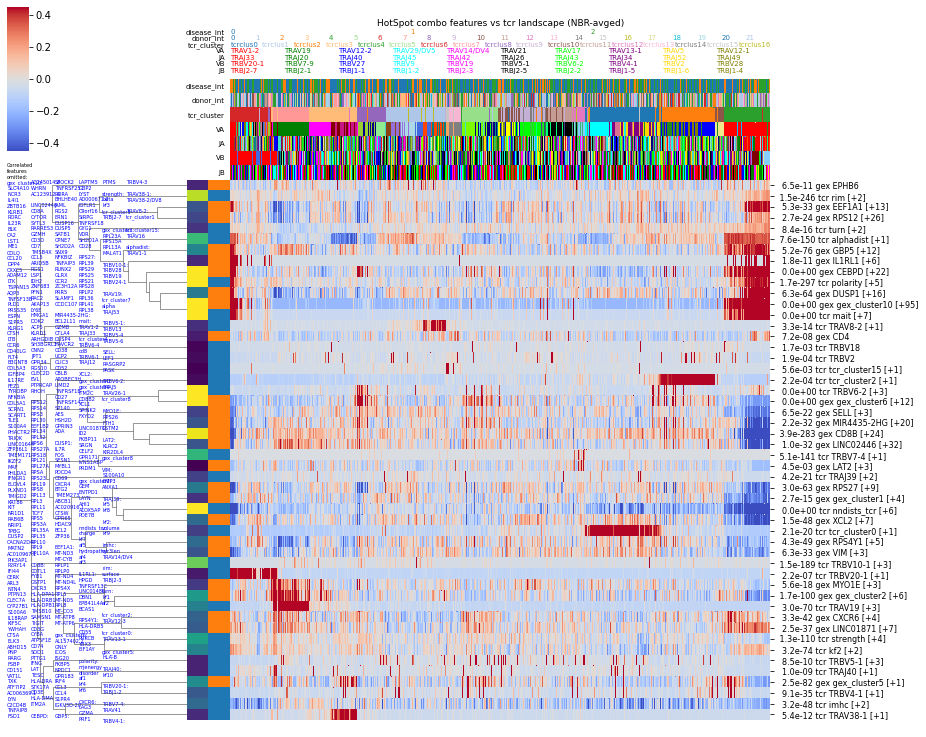

In [12]:
# run the graph-vs-features analysis and store results 
#  in adata.uns['conga_results']
conga.correlations.run_graph_vs_features(
    adata, all_nbrs, outfile_prefix = out_prefix)

# generate plots visualizing the results
conga.plotting.make_graph_vs_features_plots(
    adata, all_nbrs, out_prefix,
    clustermap_max_type_features=25,
)

# run an alternative graph-vs-features analysis
#  using the Yosef lab's HotSpot algorithm
conga.correlations.find_hotspots_wrapper(
    adata, all_nbrs, nbr_fracs = [0.1],
    outfile_prefix = out_prefix,
)

# generate plots visualizing the results
conga.plotting.make_hotspot_plots(
    adata, all_nbrs,
    outfile_prefix = out_prefix,
    clustermap_max_type_features=25,
)

# Run CoNGA TCR clumping analysis

This analysis identifies TCR neighborhoods that are overpopulated relative to a background
expectation based on a simple model of V(D)J recombination. These TCR clumps or clusters may
represent epitope-specific responses, invariant T cell populations, or other potentially
interesting T cell subsets. This analysis does not directly use the GEX information,
although we can subsequently look at GEX features of the identified clusters (see the tcr clumping logo plots below)


parse_tcr_junctions: 0 8585
parse_tcr_junctions: 1000 8585
parse_tcr_junctions: 2000 8585
parse_tcr_junctions: 3000 8585
parse_tcr_junctions: 4000 8585
parse_tcr_junctions: 5000 8585
parse_tcr_junctions: 6000 8585
parse_tcr_junctions: 7000 8585
parse_tcr_junctions: 8000 8585
success_rate: 83.99
success_rate: 92.89
util.run_command: cmd= /home/pbradley/gitrepos/conga/tcrdist_cpp/bin/calc_distributions -f tmp_0.5977002896115465_tcr_clumping_tcrs.tsv -m 96 -d /home/pbradley/gitrepos/conga/tcrdist_cpp/db/tcrdist_info_human.txt -a tmp_0.5977002896115465_tcr_clumping_bg_achains.tsv -b tmp_0.5977002896115465_tcr_clumping_bg_bchains.tsv -o tmp_0.5977002896115465_tcr_clumping_dists.txt
util.run_command: cmd= /home/pbradley/gitrepos/conga/tcrdist_cpp/bin/find_neighbors -f tmp_0.5977002896115465_tcr_clumping_tcrs.tsv -t 96 -d /home/pbradley/gitrepos/conga/tcrdist_cpp/db/tcrdist_info_human.txt -o tmp_0.5977002896115465_tcr_clumping -a tmp_0.5977002896115465_tcr_clumping_agroups.txt -b tmp_0.597700

... storing 'test' as categorical


run rank_genes_groups [('none', 8182), ('clp_0_1', 250), ('clp_0_2', 58), ('clp_0_3', 24), ('clp_0_4', 12), ('clp_0_5', 12), ('clp_0_6', 11), ('clp_0_7', 10), ('clp_0_8', 9), ('clp_0_9', 9), ('clp_0_10', 8)]
making cluster logos: 0 10 conga_abtcr_tcr_clumping_logos.png
making cluster logos: 1 10 conga_abtcr_tcr_clumping_logos.png
making cluster logos: 2 10 conga_abtcr_tcr_clumping_logos.png
making cluster logos: 3 10 conga_abtcr_tcr_clumping_logos.png
making cluster logos: 4 10 conga_abtcr_tcr_clumping_logos.png
making cluster logos: 5 10 conga_abtcr_tcr_clumping_logos.png
making cluster logos: 6 10 conga_abtcr_tcr_clumping_logos.png
making cluster logos: 7 10 conga_abtcr_tcr_clumping_logos.png
making cluster logos: 8 10 conga_abtcr_tcr_clumping_logos.png
making cluster logos: 9 10 conga_abtcr_tcr_clumping_logos.png
making: conga_abtcr_tcr_clumping_logos.png
writing help message to file: conga_abtcr_tcr_clumping_logos.png_README.txt
making: conga_abtcr_tcr_clumping.png


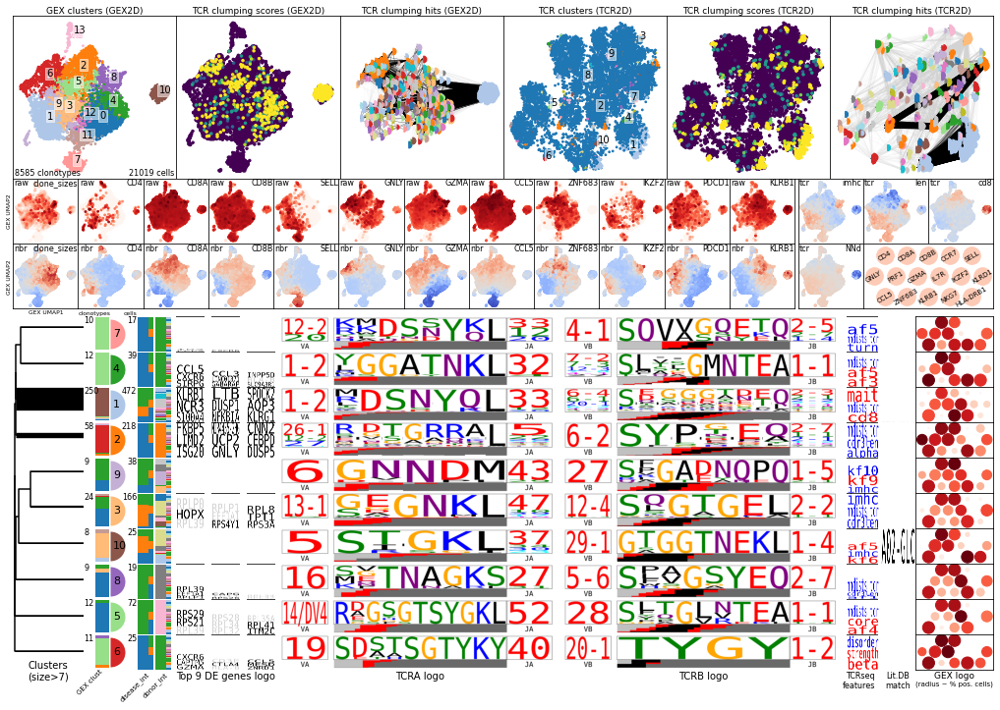

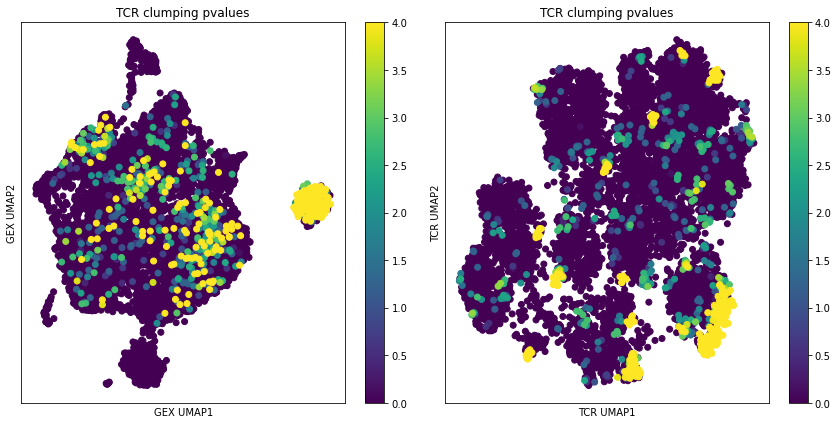

In [13]:
# Run TCR clumping analysis 
conga.tcr_clumping.assess_tcr_clumping(
    adata, outfile_prefix = out_prefix,
)

# make plots to visualize the results
conga.plotting.make_tcr_clumping_plots(
    adata, nbrs_gex, nbrs_tcr, out_prefix, 
    min_cluster_size_for_logos=8,
)


# Save processed `adata` file
This can be reloaded for re-analysis later

In [14]:
# print all the results that have been stored in adata.uns['conga_results']
print('conga results keys:', ' '.join(adata.uns['conga_results'].keys()))

# show the stats that are stored in adata.uns['conga_stats']
adata.uns['conga_stats']

conga results keys: tcr_db_match tcr_db_match_help graph_vs_graph graph_vs_graph_help graph_vs_graph_logos graph_vs_graph_logos_help tcr_graph_vs_gex_features tcr_graph_vs_gex_features_help tcr_genes_vs_gex_features tcr_genes_vs_gex_features_help gex_graph_vs_tcr_features gex_graph_vs_tcr_features_help graph_vs_features_gex_clustermap graph_vs_features_gex_clustermap_help graph_vs_features_tcr_clustermap graph_vs_features_tcr_clustermap_help tcr_graph_vs_gex_features_plot tcr_graph_vs_gex_features_plot_help tcr_graph_vs_gex_features_panels tcr_graph_vs_gex_features_panels_help tcr_genes_vs_gex_features_panels tcr_genes_vs_gex_features_panels_help gex_graph_vs_tcr_features_plot gex_graph_vs_tcr_features_plot_help gex_graph_vs_tcr_features_panels gex_graph_vs_tcr_features_panels_help hotspot_features hotspot_features_help hotspot_gex_umap hotspot_gex_umap_help hotspot_gex_clustermap hotspot_gex_clustermap_help hotspot_tcr_umap hotspot_tcr_umap_help hotspot_tcr_clustermap hotspot_tcr_clus

{'min_genes_per_cell': 500,
 'max_genes_per_cell': 3000,
 'max_percent_mito': 0.1,
 'num_filt_max_genes_per_cell': 4650,
 'num_filt_max_percent_mito': 1914,
 'num_antibody_features': 0,
 'num_TR_genes': 171,
 'num_TR_genes_in_hvg_set': 89,
 'num_highly_variable_genes': 682,
 'num_cells_after_filtering': 54064,
 'num_clonotypes': 8585,
 'max_clonotype_size': 336,
 'num_singleton_clonotypes': 6273,
 'num_gvg_hit_clonotypes': 912,
 'num_gvg_hit_biclusters': 18}

In [15]:
# save adata object to a file for later analysis
adata_file = out_prefix+'_final.h5ad'
adata.write(adata_file)

# make an .html summary file for viewing in a browser
html_file = out_prefix+'_results_summary.html'
conga.plotting.make_html_summary(adata, html_file)

making: conga_abtcr_results_summary.html
make_html_summary:: no results for content_tag graph_vs_graph_stats
make_html_summary:: no results for content_tag tcr_db_match_plot
make_html_summary:: no results for content_tag graph_vs_summary
make_html_summary:: no results for content_tag gex_clusters_tcrdist_trees
make_html_summary:: no results for content_tag conga_threshold_tcrdist_tree
make_html_summary:: no results for content_tag batch_umaps


# Alternative Method: Using the scripted CoNGA pipeline.
In addition to using CoNGA interactively like we did above, there is a scripted pipeline that can be run from the command line. The `run_conga.py` script allows you to run all available modes of analysis or specify which analyses to perform, and nearly every parameter in the workflow can be specified using command arguments. Arguments can be entered individually in the command or through a YAML-formatted configuration file. 

In this example we will analyze the TCRgd data (i.e., the data on gamma-delta T cells) with the `run_conga.py` script.

In [17]:
# you would need to change the python executable and script name to match your install locations
#
!/home/pbradley/anaconda2/envs/scanpy_2021a/bin/python /home/pbradley/gitrepos/conga/scripts/run_conga.py \
    --gex_data merged_gex_gdtcr.h5ad \
    --gex_data_type h5ad \
    --outfile_prefix conga_gdtcr \
    --organism human_gd \
    --batch_keys disease_int donor_int \
    --short_clustermaps \
    --no_kpca --all


--all implies --graph_vs_graph ==> Running graph_vs_graph analysis.
--all implies --graph_vs_graph_stats ==> Running graph_vs_graph_stats analysis.
--all implies --graph_vs_features ==> Running graph_vs_features analysis.
--all implies --cluster_vs_cluster ==> Running cluster_vs_cluster analysis.
--all implies --find_hotspot_features ==> Running find_hotspot_features analysis.
--all implies --find_gex_cluster_degs ==> Running find_gex_cluster_degs analysis.
--all implies --tcr_clumping ==> Running tcr_clumping analysis.
--all implies --match_to_tcr_database ==> Running match_to_tcr_database analysis.
--all implies --make_tcrdist_trees ==> Running make_tcrdist_trees analysis.
--no_kpca implies --use_exact_tcrdist_nbrs and --use_tcrdist_umap and --use_tcrdist_clusters
setting those flags now
scanpy==1.6.1 anndata==0.7.5 umap==0.4.6 numpy==1.19.5 scipy==1.5.3 pandas==1.1.5 scikit-learn==0.24.1 statsmodels==0.12.1 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3
WARNING --clones_file f

## display the .html-formatted results here in the notebook

In [20]:
from IPython.display import display, HTML

html_file = 'conga_gdtcr_results_summary.html'
html_lines = open(html_file,'r').read()

display(HTML(html_lines))